# Exercise Session 2 - Kalman filter
## Preparation
In order to be productive during this exercise session, you will have to:
- Watch and understand the video lecture movies of lecture 2 and 3 provided on Toledo.
- Know and understand the multi-dimensional Kalman filter equations as described in the lecture

## Questions to hand in at the beginning of the lab
1. Write down the Kalman filter equations, both the prediction and the measurement step.
2. Write down the covariance matrix of the noise on the position and velocity prediction step, knowing that the standard deviation is 0,1 [m] and 0,5 [m/s].
3. What is the dimension of the H matrix in the Kalman filter equations when there are 3 states, 2 measurement and 1 input ?
4. Assume the state of a system is given by:
$\begin{equation*}
\boldsymbol{x} = \begin{bmatrix}
a \\
b \\
c
\end{bmatrix} 
\end{equation*}$, and the measurement model of that system is given by:
$\begin{equation}
\label{eq:prediction}
\begin{aligned}
\boldsymbol{h} & = 
\begin{bmatrix}
d \\
e
\end{bmatrix} = \begin{bmatrix}
b\sin(a) \\
c\cos(a)
\end{bmatrix}
\end{aligned}
\end{equation}$. Write down the Jacobian linearization matrix of the measurement model

## Introduction
In the previous session, we discussed the discrete bayes. This i a complete filter that has applications. But it is not used that often in practise, as it has significant drawbacks:
 - The filter does not scale wel. In our examples of last week we kept track of 1 variable. Maybe we would like to track the (x,y) position of our dog, and its velocities as wel? Additional variables would increase the required calculation time exponentially. If $t$ is the time required for 1 variable, than 4 variables require $t^4$ calculation time, every iterations. 
 - The filter is discrete, yet our world is continuous. Every time we predicted/updated the probability distribution, we needed to calculate new values for every possible position. We only had 10 possible locations for our dog. But assume we wanted to know its location with 1cm accuracy on a 100mx100m field. This would require 100.000.000 possible values. 
 
The output of the filter is also multimodal, in our dog tracking example, that means that there might be multiple positions with high probability. Sometimes, filters like the discrete bayes filter are used just for that property. But in other situations it is more desireable to have a single position output. 
 
Today we will discuss the Kalman filter. In contrast to the discrete Bayes filter, the Kalman filter is:
 - Unimodal 
 - Uses continous (normal) distrubitons, which are described completely by just their average and standard deviation
 - Scales well when more values are added to the state

# Exercise 1
We want to design a Kalman filter that tracks the position/velocity of a truck on infinitely long straight rails. Initially the truck is stationary at position 0, then it starts moving with an unknown
acceleration. We measure the position of the truck every = 0,1 seconds, but these measurements are imprecise; we want to obtain an estimate of where the truck is and what its velocity is. We assume that between every time-step the truck undergoes a constant acceleration of a = 0,1
[m/s²] . The process model uncertainty is normally distributed, with mean [0,0] and standard deviations of 0,2 [m] and 0,1[m/s]

At each time step, a noisy measurement of the true position of the truck is made. Let us suppose the measurement noise is also normally distributed, with mean 0 and standard deviation 0,05 [m].

1. Write down the prediction and measurement equations
2. Determine all the relevant matrices for the Kalman filter design: F, H, Q, R, x_0, P_0
3. Simulate the Kalman filter behavior using the template below. The input signal and the measurements are specified in the template. Try changing the noise matrices, the initial conditions and make a comparison to dead reckoning.


In [7]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
pio.renderers.default = 'notebook_connected' # or "colab" if online

In [10]:
# Parameters
dt = 0.1 # Size of timesteps
t_end = 10 # End time
a = 0.1 # Constant acceleration between time steps
noise = True # Add noise to measurements
dead_reckoning = False # Use dead reckoning or Kalman for position estimation

# Initial state estimate x0 (it is a column vector!!!):
X0 = np.matrix([[0], [0]])

# The covariance matric of the uncertainty of the initial state estimate P0:
P0=np.diag([1.0, 0.5])

# Covariance of the state prediction Q:
Q=np.diag([0.2, 0.1])

# Covariance matric of the uncertainty on the measurements R:
R=np.matrix([[0.05**2]])

# The state prediction matrix:
F=np.matrix([[1.0, 0.1], [0.0, 1.0]])

# The measurement state matrix:
H=np.matrix([[1.0, 0.0]]) # measure position

# Input signals
u=np.matrix([[a*dt**2/2], [a*dt]])

If you filled in the matrices correctly in the cell above, you should be able to simulate the filter by running the cell below with no changes:

In [11]:
t = np.linspace(0, t_end, num=int(t_end/dt)+1, endpoint=True) # Time vector
n = len(t) # Number of timesteps

step = a*np.ones(n)
ramp = a*t # Velocity
quad = 1.0/2.0*a*t**2 # Position

X_real = quad # True position
V_real = ramp # True velocity

# Construct measurement vector
if noise:
    Z_measured = quad + np.random.normal(0, np.sqrt(R.item(0)), n)
else:
    Z_measured = quad

# Initialize pose estimate 
P=P0
X=X0

# Initialize collections
Xtot= np.zeros([len(X), len(t)]) 
Ptot=np.zeros([len(np.diag(P)), len(t)])

# Main loop
for i in range(n):
    
    # Process model
    X_pred = F*X + np.eye(2)*u
    P_pred = F*P*F.T + Q
    
    # Measurement model
    K = P_pred*H.T*np.linalg.inv(H*P_pred*H.T+R)
    z = Z_measured[i]
    
    # Dead reckoning override
    if dead_reckoning:
        X = X_pred
        P = P_pred
    
    # Update state 
    else:
        X = X_pred + K*(z-H*X_pred)
        P = (np.eye(np.size(K)) - K*H)*P_pred
        
    # Add result to collection
    Xtot[:,i] = X.flatten()
    Ptot[:,i] = np.diag(P).flatten()

    
# Plotting    
fig = go.Figure()
fig = make_subplots(rows=1, cols=2,subplot_titles=("Position", "Velocity"))

# Plot positions
fig.add_trace(go.Scatter(x=t,y=Xtot[0],name="Estimated position"), row=1, col=1)
fig.add_trace(go.Scatter(x=t,y=X_real,name="True position"), row=1, col=1)
fig.add_trace(go.Scatter(x=t,y=Z_measured,name="Measured position"), row=1, col=1)
fig.update_xaxes(title_text="Time [s]", row=1, col=1)
fig.update_yaxes(title_text="Position [m]", row=1, col=1)

# Plot velocities
fig.add_trace(go.Scatter(x=t,y=Xtot[1],name="Estimated velocity"), row=1, col=2)
fig.add_trace(go.Scatter(x=t,y=V_real,name="True velocity"), row=1, col=2)
fig.update_xaxes(title_text="Time [s]", row=1, col=2)
fig.update_yaxes(title_text="Velocity [m/s]", row=1, col=2)

fig.show()

# Plot residuals seperately
fig = go.Figure()
fig = make_subplots(rows=1, cols=2,subplot_titles=("Position residual", "Velocity residual"))

# Plot positions
fig.add_trace(go.Scatter(x=t,y=Xtot[0] - X_real,name="Position residual"), row=1, col=1)
fig.update_xaxes(title_text="Time [s]", row=1, col=1)
fig.update_yaxes(title_text="Position residual [m]", row=1, col=1)

# Plot velocities
fig.add_trace(go.Scatter(x=t,y=Xtot[1] - V_real,name="Velocity Residual"), row=1, col=2)
fig.update_xaxes(title_text="Time [s]", row=1, col=2)
fig.update_yaxes(title_text="Velocity residual [m/s]", row=1, col=2)
fig.show()

# Exercise 2 (TODO fix with chapter 11)

We want to track the position and altitude of an aircraft flying over a military base, using a ground-based radar. Radars work by emitting radio waves or microwaves. Anything in the beam's path will reflect some of the signal back to the radar. By timing how long it takes for the reflected signal to return it can compute the slant distance to the target. Slant distance is the straight line distance from the radar to the object. 

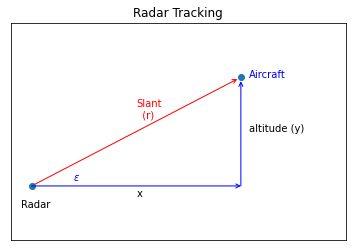

In [18]:
import ekf_internal
ekf_internal.show_radar_chart()

20 times per second, we get a measurement from the distance sensor, which is normally distributed with a standard deviation of 5 meters. Planes passing the compound, generally have an altitude of around 1000 meters, and fly by at speeds around 270 km/h.

For the process model uncertainties, assume a standard deviation of 0.05 on position and/or velocities. A standard deviation of 0.1 meters applies to altitudes.
1. Write down the prediction and measurement equations
2. Design an extended Kalman filter to estimate the state of the system. Add the measurement model to the file "radar_model.m"
3. Simulate the Kalman filter behavior using the template below. Try changing the noise matrices and the initial conditions.

In [22]:
# Parameters
dt = 0.05 # Length of timesteps [s]
a = 0
t_end = 20 # End time
v = 100
altitude = 1000
noise = True # Add noise to measurements
dead_reckoning = False # Use dead reckoning or Kalman for position estimation

# Intial state estimate
X0 = np.matrix([[0], [200], [1350]]) # Initial state estimate x0 (it is a column vector!!!)
P0 = np.diag([50, 50, 50]) # The covariance matric of the uncertainty of the initial state estimate 

# Covariance matrices
Q=np.diag([0.005, 0.005, 0.01]) # Covariance of the state prediction 
R=np.matrix([5**2]) # Covariance matric of the uncertainty on the measurements 

F = np.matrix([[1.0, dt, 0.0], 
              [0.0, 1.0, 0.0],
              [0.0, 0.0, 1.0]])

# Measurement model 
def radar_model(state):
    """
        state: state vector as a numpy matrix
    """
    
    x = state.item(0)
    y = state.item(2)
    
    h = np.sqrt(x**2+ y**2) # Predicted measurement
    H = np.matrix([x/h, 0.0, y/h]) # Jacobian matrix
                  
    return h, H

If you filled in the matrices correctly in the cell above, you should be able to simulate the filter by running the cell below with no changes:

In [31]:
from numpy.random import randn
import math

class RadarSim:
    """ Simulates the radar signal returns from an object
    flying at a constant altityude and velocity in 1D. 
    """
    
    def __init__(self, dt, pos, vel, alt):
        self.pos = pos
        self.vel = vel
        self.alt = alt
        self.dt = dt
        
    def get_range(self):
        """ Returns slant range to the object. Call once 
        for each new measurement at dt time from last call.
        """
        
        # add some process noise to the system
        self.vel = self.vel  + .1*randn()
        self.alt = self.alt + .1*randn()
        self.pos = self.pos + self.vel*self.dt
    
        # add measurement noise
        err = self.pos * 0.05*randn()
        slant_dist = math.sqrt(self.pos**2 + self.alt**2)
        
        return slant_dist + err

t = np.linspace(0, t_end, num=int(t_end/dt)+1, endpoint=True) # Time vector
n = len(t) # Number of timesteps
X_real = np.zeros(n) # True position
V_real = np.zeros(n) # True velocity
Y_real = np.zeros(n) # True altitude
radar = RadarSim(dt, pos=0., vel=100., alt=1000.)

# Initialize pose estimate
P=P0
X=X0

# Initialize collections
Xtot= np.zeros([len(X), len(t)]) 
Ptot=np.zeros([len(np.diag(P)), len(t)])
Z_measured = np.ones(n) 


# Main loop
for i in range(n):
    
    # Process model
    X_pred = F*X 
    P_pred = F*P*F.T + Q
    
    # Measurement model
    z = radar.get_range()    
    h, H = radar_model(X_pred)
    
    # Dead reckoning override
    if dead_reckoning:
        X = X_pred
        P = P_pred
    
    # Update state 
    else:
        K = P_pred*H.T*np.linalg.inv(H*P_pred*H.T+R)
        X = X_pred + K*(z-H*X_pred)
        P = (np.eye(np.size(K)) - K*H)*P_pred
        
    # Add result to collection
    Xtot[:,i] = X.flatten()
    Ptot[:,i] = np.diag(P).flatten()
    X_real[i] = radar.pos
    V_real[i] = radar.vel
    Y_real[i] = radar.alt
    Z_measured[i] = z
    
# Plotting
fig = go.Figure()
fig = make_subplots(rows=1, cols=3,subplot_titles=("Position", "Velocity", "Altitude"))

# Plot positions
fig.add_trace(go.Scatter(x=t,y=Xtot[0],name="Estimated position"), row=1, col=1)
fig.add_trace(go.Scatter(x=t,y=X_real,name="True position"), row=1, col=1)
fig.update_xaxes(title_text="Time [s]", row=1, col=1)
fig.update_yaxes(title_text="Position [m]", row=1, col=1)

# Plot velocities
fig.add_trace(go.Scatter(x=t,y=Xtot[1],name="Estimated velocity"), row=1, col=2)
fig.add_trace(go.Scatter(x=t,y=V_real,name="True velocity"), row=1, col=2)
fig.update_xaxes(title_text="Time [s]", row=1, col=2)
fig.update_yaxes(title_text="Velocity [m/s]", row=1, col=2)

# Plot altitude
fig.add_trace(go.Scatter(x=t,y=Xtot[2],name="Estimated altitude"), row=1, col=3)
fig.add_trace(go.Scatter(x=t,y=Y_real,name="True altitude"), row=1, col=3)
fig.update_xaxes(title_text="Time [s]", row=1, col=3)
fig.update_yaxes(title_text="Altitude [m]", row=1, col=3)

fig.show()

# Plot residuals seperately
fig = go.Figure()
fig = make_subplots(rows=1, cols=3,subplot_titles=("Position residual", "Velocity residual", "Altitude residual"))

# Plot positions
fig.add_trace(go.Scatter(x=t,y=Xtot[0] - X_real,name="Position residual"), row=1, col=1)
fig.update_xaxes(title_text="Time [s]", row=1, col=1)
fig.update_yaxes(title_text="Position residual [m]", row=1, col=1)

# Plot velocities
fig.add_trace(go.Scatter(x=t,y=Xtot[1] - V_real,name="Velocity Residual"), row=1, col=2)
fig.update_xaxes(title_text="Time [s]", row=1, col=2)
fig.update_yaxes(title_text="Velocity residual [m/s]", row=1, col=2)

# Plot altitude
fig.add_trace(go.Scatter(x=t,y=Xtot[2] - Y_real,name="Altitude Residual"), row=1, col=3)
fig.update_xaxes(title_text="Time [s]", row=1, col=3)
fig.update_yaxes(title_text="Altitude residual [m]", row=1, col=3)

fig.show()

# Exercise 3

For our final exercise, we will determine the relevant equations and matrices for 2D localization of a mobile robot. Specifically, we want to track the position and the orientation of the robot. The robot is equipped with 2 types of sensors:
 - The odometry sensors return the distance driven and the angle turned by the robot since the last timestep
 - The LIDAR sensor returns the distance and the angle between the robot and a detected landmark.
 
 Write down the prediction and update equations (don't forget the jacobian matrices). You can use the code below to simulate this filter.


## State vector

$\begin{equation}
\boldsymbol{x} = \begin{bmatrix}
x \\
y \\
\theta
\end{bmatrix}
\end{equation}$ 

Where:
- $\boldsymbol{x}$ : the state vector. This is a [$n$x1] vector with $n$ being the number of state variables
- $x$: the x-coordinate of the robot
- $y$: the y-coordinate of the robot
- $\theta$: the heading angle of the robot relative to the x-axis

$\begin{equation}
\boldsymbol{P} = \begin{bmatrix}
\sigma_{x}^2 & 0 & 0 \\
0 & \sigma_{y}^2 & 0 \\
0 & 0 & \sigma_\theta^2 
\end{bmatrix}
\end{equation}$

## Prediction
$\begin{equation}
\begin{aligned}
\boldsymbol{x}_{k} & = \boldsymbol{f}\left(\boldsymbol{x_{k-1}}, \boldsymbol{u_k} \right) \\
\boldsymbol{x}_{k}  & = \begin{cases}
x_{k}= x_{k-1} + ds\cos(\theta_{k-1} + d\theta_k) \\
y_{k} = y_{k-1} + ds\sin(\theta_{k-1} + d\theta_k) \\
\theta_{k} = \theta_{k-1} + d\theta_k
\end{cases} 
\end{aligned}
\end{equation}$ 	
Where: 
 - $\boldsymbol{u}$ = control vector [mx1]. In our case, this vector contains odometry measurements ($\boldsymbol{u} = [ds, d\theta]$, with $ds$ the distance and $d\theta$ the distance traveled since the previous timestep)

$\begin{equation}
\boldsymbol{V} = \begin{bmatrix}
\sigma_{ds}^2 & 0 \\
0 & \sigma_\theta^2 
\end{bmatrix}
\end{equation}$

$\begin{equation}
\boldsymbol{F_x} = \frac{\partial \boldsymbol{f}}{\partial \boldsymbol{x}} = \begin{bmatrix}
1 & 0 & - \Delta s \sin(\theta_k + \Delta \theta_k) \\
0 & 1 & \Delta s \cos(\theta_k + \Delta \theta_k) \\
0 & 0 & 1
\end{bmatrix}
\end{equation}$

## Update
$\begin{equation}
\label{eq:measurement_model}
\boldsymbol{h}(\boldsymbol{\hat{x}}_{k|k-1}) =
\begin{bmatrix}
\sqrt{(y_f - \tilde{y_k})^2 + (x_f - \tilde{x_k})^2} \\
\arctan(\frac{\tilde{y_k} - y_v}{\tilde{x_k} - x_v} - \tilde{\theta_k})
\end{bmatrix} = \begin{bmatrix}
r \\
\beta
\end{bmatrix}
\end{equation}$ Where: 

 - $\boldsymbol{h}(\boldsymbol{\hat{x}}_{k|k-1})$ measurement at time $k$
 - $x_f$: x-coordinate of known feature
 - $y_f$: y-coordinate of known feature
 - $\tilde{x_k}$: predicted x-coordinate of robot
 - $\tilde{y_k}$: predicted y-coordinate of robot
 - $\tilde{\theta_k}$: predicted heading angle of robot

$\begin{equation}
\boldsymbol{H_x} = \frac{\partial \boldsymbol{h}}{\partial \boldsymbol{x}} = \begin{bmatrix}
- \frac{x_f - x_v}{r} & - \frac{y_f - y_v}{r} & 0 \\
\frac{y_f - y_v}{r^2} & \frac{x_f - x_v}{r^2}  & 1
\end{bmatrix}
\end{equation}$


In [2]:
import os
os.sys.path.append(os.path.dirname(os.path.abspath('.')))
import PythonRobotics.Localization.extended_kalman_filter.extended_kalman_filter as EKF

In /home/robin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/robin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/robin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In /home/robin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In /home/robin/.local/lib/python3.6/site-packages/matplotlib/mpl-data/stylel

/home/robin/Nextcloud/Vakken/Mobile_robotics/MobileRoboticsGT/PythonRobotics/Localization/extended_kalman_filter/extended_kalman_filter.py start!!


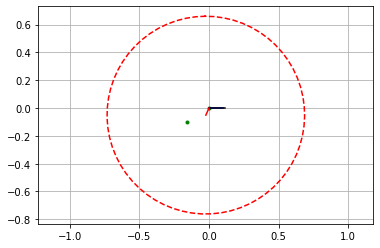

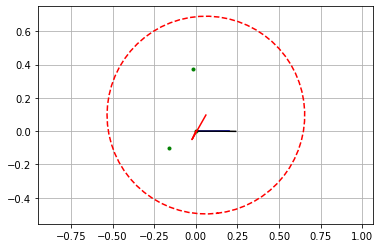

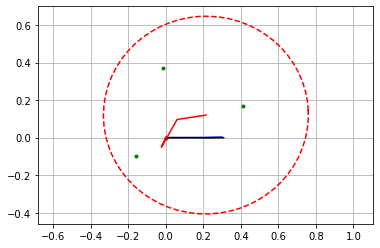

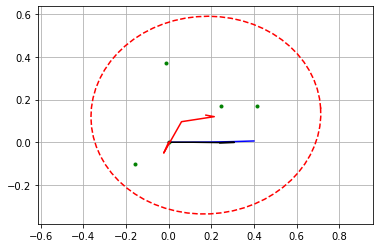

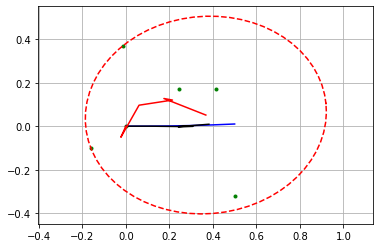

...

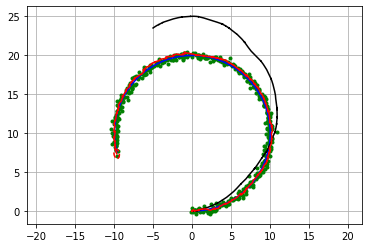

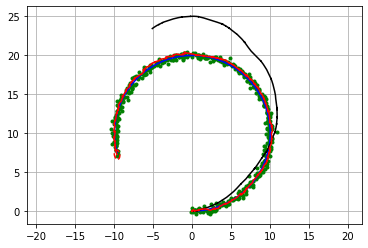

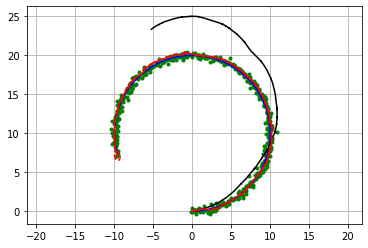

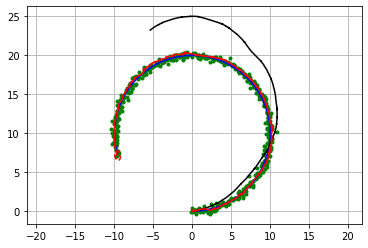

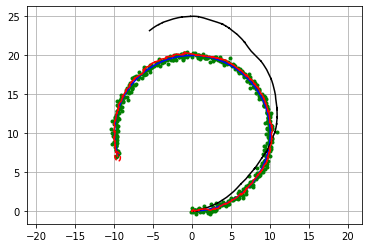

In [4]:
EKF.main()

# Further reading

Kalman and Bayesian Filters in python, chapter 8: Designing Kalman Filters
Kalman and Bayesian Filters in python, chapter 11: Extended Kalman Filters